In [1]:
import warnings
from pathlib import Path

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from model_recycling_stats.settings import settings

warnings.filterwarnings("ignore")

In [2]:
EXP_ID = "apch"
ALPHA = 0.05 / 15

RESULTS_DIR = Path().cwd() / "results"

RESULTS_DIR.mkdir(parents=True, exist_ok=True)

In [3]:
all_stats = pd.DataFrame(columns=["experiment", "project", "precision", "recall", "gmean", "auc", "f1"])

for i, exp in enumerate(settings.EXPERIMENTS):
    stats_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_stats_nn.csv")
    stats_df["experiment"] = exp
    stats_df = stats_df[["experiment", "project", "precision", "recall", "gmean", "auc", "f1"]]
    all_stats = pd.concat([all_stats, stats_df], ignore_index=True)

def get_approach(exp):
    if exp in settings.MODEL_SELECTION_EXPERIMENTS:
        return "model selection"
    elif exp in settings.MODEL_STACKING_EXPERIMENTS:
        return "model stacking"
    elif exp in settings.MODEL_VOTING_EXPERIMENTS:
        return "model voting"
    elif exp in settings.MODEL_REUSE_EXPERIMENTS:
        return "model reuse"
    elif exp in settings.CLUSTERING_EXPERIMENTS:
        return "clustering"
    else:
        raise ValueError(f"Unknown experiment {exp}")

all_stats["approach"] = all_stats["experiment"].apply(get_approach)

# for each experiment, find count of projects with statistically significant improvement in each metric column
all_stats["precision_sig"] = all_stats["precision"].apply(lambda x: x <= ALPHA)
all_stats["recall_sig"] = all_stats["recall"].apply(lambda x: x <= ALPHA)
all_stats["gmean_sig"] = all_stats["gmean"].apply(lambda x: x <= ALPHA)
all_stats["auc_sig"] = all_stats["auc"].apply(lambda x: x <= ALPHA)
all_stats["f1_sig"] = all_stats["f1"].apply(lambda x: x <= ALPHA)

all_stats.head()

,experiment,project,precision,recall,gmean,auc,f1,approach,precision_sig,recall_sig,gmean_sig,auc_sig,f1_sig
0,ms-exp1,activemq,1.171869e-02,1.171869e-02,1.171869e-02,3.906250e-03,1.171869e-02,model selection,False,False,False,False,False
1,ms-exp1,camel,7.194686e-13,9.370391e-14,3.709920e-15,5.592726e-16,1.266519e-13,model selection,True,True,True,True,True
2,ms-exp1,cassandra,3.814697e-06,3.814697e-05,3.814697e-06,3.814697e-06,3.814697e-06,model selection,True,True,True,True,True
3,ms-exp1,flink,1.455192e-11,1.990739e-07,2.910383e-11,1.455192e-11,1.455192e-11,model selection,True,True,True,True,True
4,ms-exp1,groovy,1.144409e-05,2.021790e-03,3.917694e-03,1.144409e-05,3.814697e-05,model selection,True,True,False,True,True


In [4]:
def get_formatting_count(count):
    formatting = ""
    if count >= 6:
        formatting = "\\cellcolor{red!50}"
    elif count >= 4:
        formatting = "\\cellcolor{orange!50}"
    elif count >= 2:
        formatting = "\\cellcolor{yellow!50}"
    return formatting

for approach in all_stats["approach"].unique():
    temp = all_stats[all_stats["approach"] == approach]
    print(f"Approach: {approach}")
    summary_stats = temp.groupby(["experiment"]).agg(
        precision=("precision_sig", "sum"),
        recall=("recall_sig", "sum"),
        gmean=("gmean_sig", "sum"),
        auc=("auc_sig", "sum"),
        f1=("f1_sig", "sum"),
    )
    summary_stats = summary_stats.reset_index()

    # loop through rows and find which column for each row has the highest value
    for row in summary_stats.index:
        col = summary_stats.loc[row]
        for metric in ["precision", "recall", "gmean", "auc", "f1"]:
            formatting = get_formatting_count(col[metric])
            # redo formatting for a specific cell
            summary_stats.loc[row, metric] = f"{formatting}{col[metric]}/8"

    print(summary_stats.to_latex(index=False, escape=False))

Approach: model selection
\begin{tabular}{llllll}
\toprule
experiment &             precision &                   recall &                 gmean &                   auc &                    f1 \\
\midrule
   ms-exp1 & \cellcolor{red!50}7/8 & \cellcolor{orange!50}5/8 & \cellcolor{red!50}6/8 & \cellcolor{red!50}7/8 & \cellcolor{red!50}7/8 \\
   ms-exp2 & \cellcolor{red!50}7/8 & \cellcolor{orange!50}5/8 & \cellcolor{red!50}6/8 & \cellcolor{red!50}7/8 & \cellcolor{red!50}7/8 \\
   ms-exp3 & \cellcolor{red!50}7/8 &    \cellcolor{red!50}6/8 & \cellcolor{red!50}6/8 & \cellcolor{red!50}7/8 & \cellcolor{red!50}7/8 \\
   ms-exp4 & \cellcolor{red!50}7/8 &    \cellcolor{red!50}6/8 & \cellcolor{red!50}6/8 & \cellcolor{red!50}7/8 & \cellcolor{red!50}7/8 \\
   ms-exp5 & \cellcolor{red!50}7/8 & \cellcolor{orange!50}5/8 & \cellcolor{red!50}6/8 & \cellcolor{red!50}7/8 & \cellcolor{red!50}7/8 \\
   ms-exp6 & \cellcolor{red!50}7/8 &    \cellcolor{red!50}6/8 & \cellcolor{red!50}6/8 & \cellcolor{red!50}7/8 

In [5]:
all_cliff = pd.DataFrame(columns=["experiment", "project", "precision", "recall", "gmean", "auc", "f1"])

for i, exp in enumerate(settings.EXPERIMENTS):
    cliff_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_cliff_nn.csv")
    cliff_df["experiment"] = exp
    cliff_df = cliff_df[["experiment", "project", "precision", "recall", "gmean", "auc", "f1"]]
    all_cliff = pd.concat([all_cliff, cliff_df], ignore_index=True)

all_cliff["approach"] = all_cliff["experiment"].apply(get_approach)
all_cliff.head()

,experiment,project,precision,recall,gmean,auc,f1,approach
0,ms-exp1,activemq,large,large,large,large,large,model selection
1,ms-exp1,camel,small,large,large,large,medium,model selection
2,ms-exp1,cassandra,large,large,large,large,large,model selection
3,ms-exp1,flink,large,large,large,large,large,model selection
4,ms-exp1,groovy,medium,large,large,large,medium,model selection


In [6]:
all_stats = all_stats.merge(all_cliff, on=["experiment", "project", "approach"], suffixes=("", "_cliff"))
all_stats.head()

,experiment,project,precision,recall,gmean,auc,f1,approach,precision_sig,recall_sig,gmean_sig,auc_sig,f1_sig,precision_cliff,recall_cliff,gmean_cliff,auc_cliff,f1_cliff
0,ms-exp1,activemq,1.171869e-02,1.171869e-02,1.171869e-02,3.906250e-03,1.171869e-02,model selection,False,False,False,False,False,large,large,large,large,large
1,ms-exp1,camel,7.194686e-13,9.370391e-14,3.709920e-15,5.592726e-16,1.266519e-13,model selection,True,True,True,True,True,small,large,large,large,medium
2,ms-exp1,cassandra,3.814697e-06,3.814697e-05,3.814697e-06,3.814697e-06,3.814697e-06,model selection,True,True,True,True,True,large,large,large,large,large
3,ms-exp1,flink,1.455192e-11,1.990739e-07,2.910383e-11,1.455192e-11,1.455192e-11,model selection,True,True,True,True,True,large,large,large,large,large
4,ms-exp1,groovy,1.144409e-05,2.021790e-03,3.917694e-03,1.144409e-05,3.814697e-05,model selection,True,True,False,True,True,medium,large,large,large,medium


In [7]:
sig_effect_stats = all_stats.copy()
sig_effect_stats["precision_sig"] = sig_effect_stats.apply(lambda x: x["precision_cliff"] if x["precision_sig"] else "", axis=1)
sig_effect_stats["recall_sig"] = sig_effect_stats.apply(lambda x: x["recall_cliff"] if x["recall_sig"] else "", axis=1)
sig_effect_stats["gmean_sig"] = sig_effect_stats.apply(lambda x: x["gmean_cliff"] if x["gmean_sig"] else "", axis=1)
sig_effect_stats["auc_sig"] = sig_effect_stats.apply(lambda x: x["auc_cliff"] if x["auc_sig"] else "", axis=1)
sig_effect_stats["f1_sig"] = sig_effect_stats.apply(lambda x: x["f1_cliff"] if x["f1_sig"] else "", axis=1)
sig_effect_stats = sig_effect_stats.drop(columns=["precision_cliff", "recall_cliff", "gmean_cliff", "auc_cliff", "f1_cliff"])
sig_effect_stats["precision"] = sig_effect_stats["precision"].apply(lambda x: f"{x:.3f}")
sig_effect_stats["recall"] = sig_effect_stats["recall"].apply(lambda x: f"{x:.3f}")
sig_effect_stats["gmean"] = sig_effect_stats["gmean"].apply(lambda x: f"{x:.3f}")
sig_effect_stats["auc"] = sig_effect_stats["auc"].apply(lambda x: f"{x:.3f}")
sig_effect_stats["f1"] = sig_effect_stats["f1"].apply(lambda x: f"{x:.3f}")
sig_effect_stats.head()

,experiment,project,precision,recall,gmean,auc,f1,approach,precision_sig,recall_sig,gmean_sig,auc_sig,f1_sig
0,ms-exp1,activemq,0.012,0.012,0.012,0.004,0.012,model selection,,,,,
1,ms-exp1,camel,0.000,0.000,0.000,0.000,0.000,model selection,small,large,large,large,medium
2,ms-exp1,cassandra,0.000,0.000,0.000,0.000,0.000,model selection,large,large,large,large,large
3,ms-exp1,flink,0.000,0.000,0.000,0.000,0.000,model selection,large,large,large,large,large
4,ms-exp1,groovy,0.000,0.002,0.004,0.000,0.000,model selection,medium,large,,large,medium


In [8]:
def get_formatting(sig):
    formatting = ""
    if sig == "small":
        formatting = "\\cellcolor{yellow!50}"
    elif sig == "medium":
        formatting = "\\cellcolor{orange!50}"
    elif sig == "large":
        formatting = "\\cellcolor{red!50}"
    return formatting

for approach in sig_effect_stats["approach"].unique():
    temp = sig_effect_stats[sig_effect_stats["approach"] == approach]
    temp = temp.drop(columns=["approach"])

    # loop through rows and find which column for each row has the highest value
    for row in temp.index:
        col = temp.loc[row]
        for metric in ["precision", "recall", "gmean", "auc", "f1"]:
            if col[f"{metric}_sig"] == "":
                temp.loc[row, metric] = ""
            else:
                formatting = get_formatting(col[f"{metric}_sig"])
                # redo formatting for a specific cell
                temp.loc[row, metric] = f"{formatting}{col[metric]}"
        
    temp = temp.drop(columns=["precision_sig", "recall_sig", "gmean_sig", "auc_sig", "f1_sig"])
    print(approach)
    print(temp.to_latex(index=False, escape=False))

model selection
\begin{tabular}{lllllll}
\toprule
experiment &   project &                  precision &                  recall &                   gmean &                     auc &                         f1 \\
\midrule
   ms-exp1 &  activemq &                            &                         &                         &                         &                            \\
   ms-exp1 &     camel & \cellcolor{yellow!50}0.000 & \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 & \cellcolor{orange!50}0.000 \\
   ms-exp1 & cassandra &    \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 &    \cellcolor{red!50}0.000 \\
   ms-exp1 &     flink &    \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 & \cellcolor{red!50}0.000 &    \cellcolor{red!50}0.000 \\
   ms-exp1 &    groovy & \cellcolor{orange!50}0.000 & \cellcolor{red!50}0.002 &                         & \cellcolor{red!50}0.000 &

In [9]:
all_mean = pd.DataFrame(columns=["experiment", "project", "precision", "recall", "gmean", "auc", "f1"])

for i, exp in enumerate(settings.EXPERIMENTS):
    mean_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_mean.csv")
    mean_df["experiment"] = exp
    mean_df = mean_df[["experiment", "project", "precision", "recall", "gmean", "auc", "f1"]]
    all_mean = pd.concat([all_mean, mean_df], ignore_index=True)

all_mean["approach"] = all_mean["experiment"].apply(get_approach)
all_mean.head()

,experiment,project,precision,recall,gmean,auc,f1,approach
0,ms-exp1,activemq,-0.027833,0.036266,0.017712,-0.003907,-0.000547,model selection
1,ms-exp1,camel,0.008526,0.005118,0.016413,0.002402,0.013406,model selection
2,ms-exp1,cassandra,-0.000925,0.006619,0.001528,0.000392,0.002736,model selection
3,ms-exp1,flink,-0.007894,0.042499,0.024673,0.000963,0.015266,model selection
4,ms-exp1,groovy,-0.013777,0.050995,0.036548,0.006131,0.018496,model selection


In [10]:
all_stats = all_stats.merge(all_mean, on=["experiment", "project", "approach"], suffixes=("", "_mean"))
all_stats.head()

,experiment,project,precision,recall,gmean,auc,f1,approach,precision_sig,recall_sig,...,precision_cliff,recall_cliff,gmean_cliff,auc_cliff,f1_cliff,precision_mean,recall_mean,gmean_mean,auc_mean,f1_mean
0,ms-exp1,activemq,1.171869e-02,1.171869e-02,1.171869e-02,3.906250e-03,1.171869e-02,model selection,False,False,...,large,large,large,large,large,-0.027833,0.036266,0.017712,-0.003907,-0.000547
1,ms-exp1,camel,7.194686e-13,9.370391e-14,3.709920e-15,5.592726e-16,1.266519e-13,model selection,True,True,...,small,large,large,large,medium,0.008526,0.005118,0.016413,0.002402,0.013406
2,ms-exp1,cassandra,3.814697e-06,3.814697e-05,3.814697e-06,3.814697e-06,3.814697e-06,model selection,True,True,...,large,large,large,large,large,-0.000925,0.006619,0.001528,0.000392,0.002736
3,ms-exp1,flink,1.455192e-11,1.990739e-07,2.910383e-11,1.455192e-11,1.455192e-11,model selection,True,True,...,large,large,large,large,large,-0.007894,0.042499,0.024673,0.000963,0.015266
4,ms-exp1,groovy,1.144409e-05,2.021790e-03,3.917694e-03,1.144409e-05,3.814697e-05,model selection,True,True,...,medium,large,large,large,medium,-0.013777,0.050995,0.036548,0.006131,0.018496


In [11]:
sig_mean_stats = all_stats.copy()
sig_mean_stats["precision_mean"] = sig_mean_stats.apply(lambda x: x["precision_mean"] if x["precision_sig"] else "", axis=1)
sig_mean_stats["recall_mean"] = sig_mean_stats.apply(lambda x: x["recall_mean"] if x["recall_sig"] else "", axis=1)
sig_mean_stats["gmean_mean"] = sig_mean_stats.apply(lambda x: x["gmean_mean"] if x["gmean_sig"] else "", axis=1)
sig_mean_stats["auc_mean"] = sig_mean_stats.apply(lambda x: x["auc_mean"] if x["auc_sig"] else "", axis=1)
sig_mean_stats["f1_mean"] = sig_mean_stats.apply(lambda x: x["f1_mean"] if x["f1_sig"] else "", axis=1)
sig_mean_stats.drop(columns=["precision_cliff", "recall_cliff", "gmean_cliff", "auc_cliff", "f1_cliff"], inplace=True)
sig_mean_stats.drop(columns=["precision_sig", "recall_sig", "gmean_sig", "auc_sig", "f1_sig"], inplace=True)
sig_mean_stats.drop(columns=["precision", "recall", "gmean", "auc", "f1"], inplace=True)
sig_mean_stats.head()

,experiment,project,approach,precision_mean,recall_mean,gmean_mean,auc_mean,f1_mean
0,ms-exp1,activemq,model selection,,,,,
1,ms-exp1,camel,model selection,0.008526,0.005118,0.016413,0.002402,0.013406
2,ms-exp1,cassandra,model selection,-0.000925,0.006619,0.001528,0.000392,0.002736
3,ms-exp1,flink,model selection,-0.007894,0.042499,0.024673,0.000963,0.015266
4,ms-exp1,groovy,model selection,-0.013777,0.050995,,0.006131,0.018496


In [12]:
def get_formatting_mean(mean):
    if mean >= 0:
        formatting = "\\cellcolor{green!50}"
    else:
        formatting = "\\cellcolor{red!50}"
    return formatting

for approach in sig_mean_stats["approach"].unique():
    temp = sig_mean_stats[sig_mean_stats["approach"] == approach]
    temp = temp.drop(columns=["approach"])

    # loop through rows and find which column for each row has the highest value
    for row in temp.index:
        col = temp.loc[row]
        for metric in ["precision", "recall", "gmean", "auc", "f1"]:
            if col[f"{metric}_mean"] == "":
                continue
            else:
                formatting = get_formatting_mean(col[f"{metric}_mean"])
                # redo formatting for a specific cell
                temp.loc[row, f"{metric}_mean"] = f"{formatting}{col[f'{metric}_mean']:.3f}"
        
    print(approach)
    print(temp.to_latex(index=False, escape=False))

model selection
\begin{tabular}{lllllll}
\toprule
experiment &   project &            precision_mean &               recall_mean &                gmean_mean &                  auc_mean &                   f1_mean \\
\midrule
   ms-exp1 &  activemq &                           &                           &                           &                           &                           \\
   ms-exp1 &     camel & \cellcolor{green!50}0.009 & \cellcolor{green!50}0.005 & \cellcolor{green!50}0.016 & \cellcolor{green!50}0.002 & \cellcolor{green!50}0.013 \\
   ms-exp1 & cassandra &  \cellcolor{red!50}-0.001 & \cellcolor{green!50}0.007 & \cellcolor{green!50}0.002 & \cellcolor{green!50}0.000 & \cellcolor{green!50}0.003 \\
   ms-exp1 &     flink &  \cellcolor{red!50}-0.008 & \cellcolor{green!50}0.042 & \cellcolor{green!50}0.025 & \cellcolor{green!50}0.001 & \cellcolor{green!50}0.015 \\
   ms-exp1 &    groovy &  \cellcolor{red!50}-0.014 & \cellcolor{green!50}0.051 &                           & \c

### MODEL SELECTION

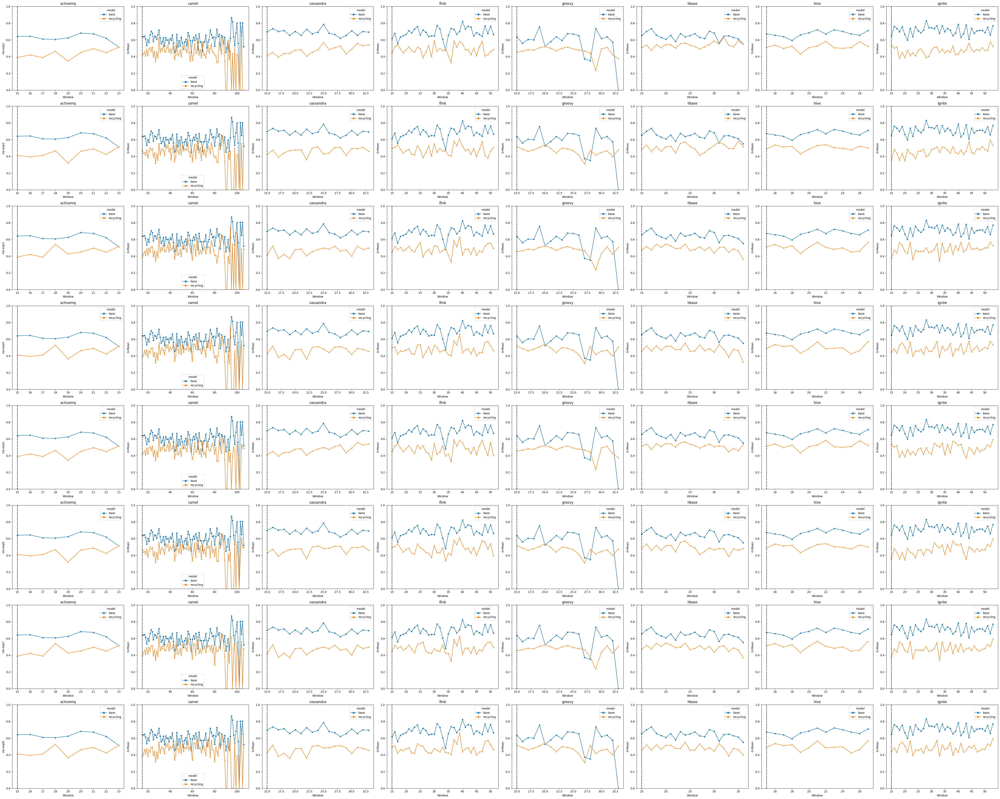

In [13]:
fig, ax = plt.subplots(figsize=(50, 5 * len(settings.MODEL_SELECTION_EXPERIMENTS)), ncols=8, nrows=len(settings.MODEL_SELECTION_EXPERIMENTS))
for i, exp in enumerate(settings.MODEL_SELECTION_EXPERIMENTS):
    for j, project in enumerate(settings.PROJECTS):
        # load baseline evaluation results
        base_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_base_eval_nn.csv")
        base_eval_df["model"] = "base"
        # load ecoselekt evaluation results
        selekt_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_selekt_eval_nn.csv")
        selekt_eval_df["model"] = "recycling"
        eval_df = pd.concat([base_eval_df[base_eval_df["window"] >= settings.MODEL_HISTORY], selekt_eval_df])
        eval_df = eval_df[eval_df["window"] == eval_df["test_split"] - 2]

        sns.lineplot(x="window", y="gmean", data=eval_df, hue="model", markers=True, style="model", dashes=False, ax=ax[i][j])
        ax[i][j].set_title(f"{project}")
        ax[i][j].set_xlabel("Window")
        ax[i][j].set_ylabel("G-Mean")
        ax[i][j].set_ylim(0, 1)
        ax[i][j].axvline(x=settings.MODEL_HISTORY, color="black", linestyle="--")
    
    # add title to row
    ax[i][0].set_ylabel(f"{exp}")

plt.tight_layout()
plt.show()

### SINGLE MODEL REUSE

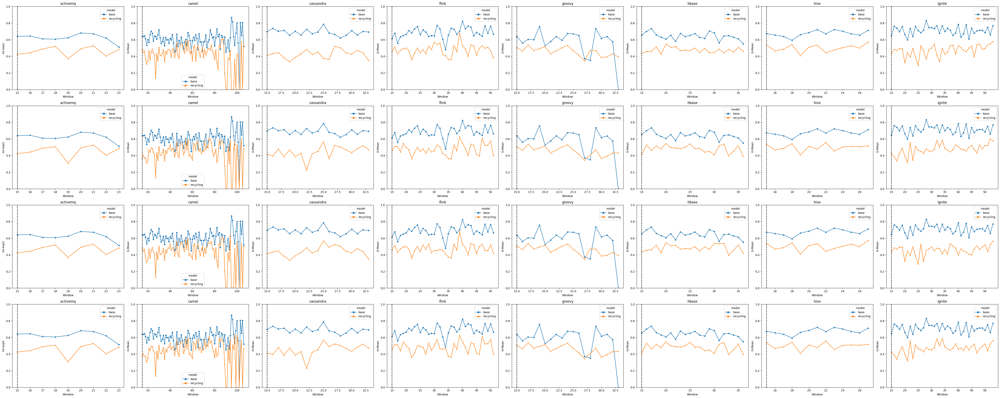

In [14]:
fig, ax = plt.subplots(figsize=(50, 5 * len(settings.MODEL_REUSE_EXPERIMENTS)), ncols=8, nrows=len(settings.MODEL_REUSE_EXPERIMENTS))
for i, exp in enumerate(settings.MODEL_REUSE_EXPERIMENTS):
    for j, project in enumerate(settings.PROJECTS):
        # load baseline evaluation results
        base_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_base_eval_nn.csv")
        base_eval_df["model"] = "base"
        # load ecoselekt evaluation results
        selekt_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_selekt_eval_nn.csv")
        selekt_eval_df["model"] = "recycling"
        eval_df = pd.concat([base_eval_df[base_eval_df["window"] >= settings.MODEL_HISTORY], selekt_eval_df])
        eval_df = eval_df[eval_df["window"] == eval_df["test_split"] - 2]

        sns.lineplot(x="window", y="gmean", data=eval_df, hue="model", markers=True, style="model", dashes=False, ax=ax[i][j])
        ax[i][j].set_title(f"{project}")
        ax[i][j].set_xlabel("Window")
        ax[i][j].set_ylabel("G-Mean")
        ax[i][j].set_ylim(0, 1)
        ax[i][j].axvline(x=settings.MODEL_HISTORY, color="black", linestyle="--")
    
    # add title to row
    ax[i][0].set_ylabel(f"{exp}")

plt.tight_layout()
plt.show()

### MODEL STACKING

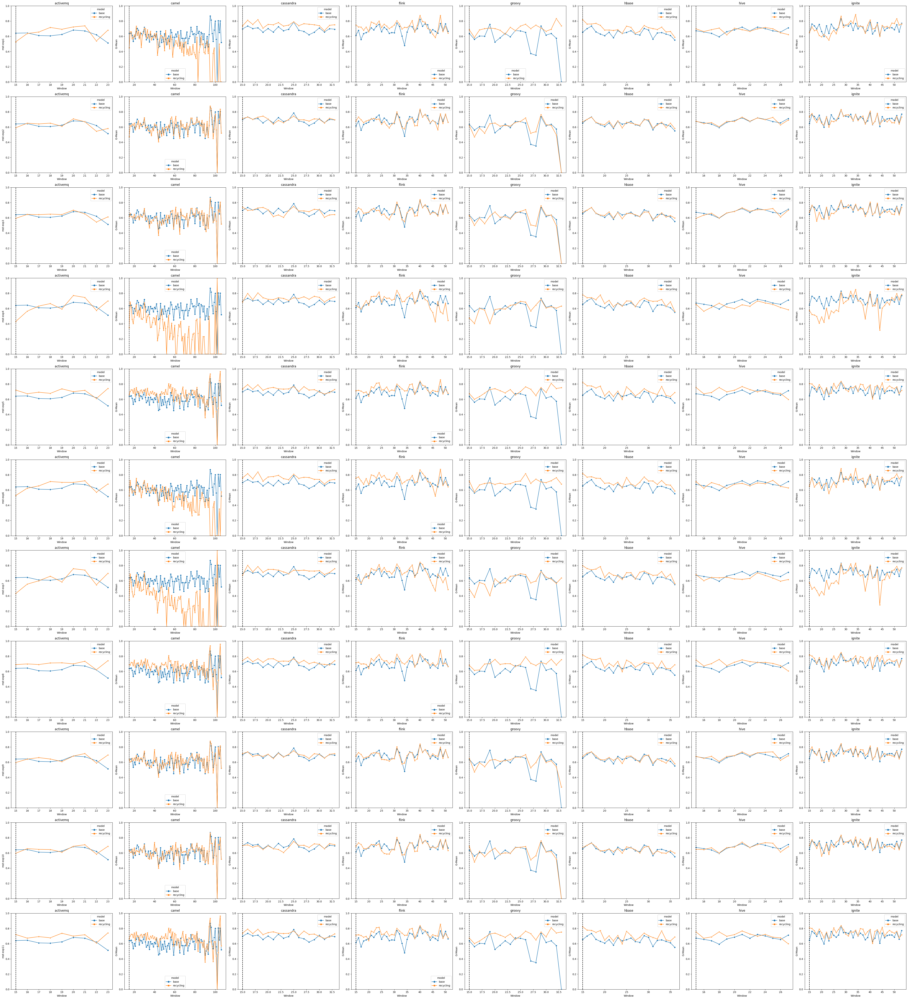

In [15]:
fig, ax = plt.subplots(figsize=(50, 5 * len(settings.MODEL_STACKING_EXPERIMENTS)), ncols=8, nrows=len(settings.MODEL_STACKING_EXPERIMENTS))
for i, exp in enumerate(settings.MODEL_STACKING_EXPERIMENTS):
    for j, project in enumerate(settings.PROJECTS):
        # load baseline evaluation results
        base_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_base_eval_nn.csv")
        base_eval_df["model"] = "base"
        # load ecoselekt evaluation results
        selekt_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_selekt_eval_nn.csv")
        selekt_eval_df["model"] = "recycling"
        eval_df = pd.concat([base_eval_df[base_eval_df["window"] >= settings.MODEL_HISTORY], selekt_eval_df])
        eval_df = eval_df[eval_df["window"] == eval_df["test_split"] - 2]

        sns.lineplot(x="window", y="gmean", data=eval_df, hue="model", markers=True, style="model", dashes=False, ax=ax[i][j])
        ax[i][j].set_title(f"{project}")
        ax[i][j].set_xlabel("Window")
        ax[i][j].set_ylabel("G-Mean")
        ax[i][j].set_ylim(0, 1)
        ax[i][j].axvline(x=settings.MODEL_HISTORY, color="black", linestyle="--")
    
    # add title to row
    ax[i][0].set_ylabel(f"{exp}")

plt.tight_layout()
plt.show()

### MODEL VOTING

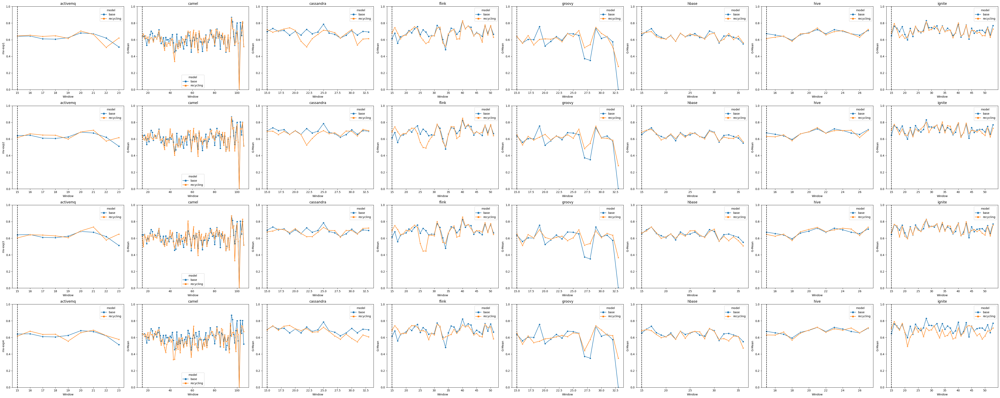

In [16]:
fig, ax = plt.subplots(figsize=(50, 5 * len(settings.MODEL_VOTING_EXPERIMENTS)), ncols=8, nrows=len(settings.MODEL_VOTING_EXPERIMENTS))
for i, exp in enumerate(settings.MODEL_VOTING_EXPERIMENTS):
    for j, project in enumerate(settings.PROJECTS):
        # load baseline evaluation results
        base_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_base_eval_nn.csv")
        base_eval_df["model"] = "base"
        # load ecoselekt evaluation results
        selekt_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_selekt_eval_nn.csv")
        selekt_eval_df["model"] = "recycling"
        eval_df = pd.concat([base_eval_df[base_eval_df["window"] >= settings.MODEL_HISTORY], selekt_eval_df])
        eval_df = eval_df[eval_df["window"] == eval_df["test_split"] - 2]

        sns.lineplot(x="window", y="gmean", data=eval_df, hue="model", markers=True, style="model", dashes=False, ax=ax[i][j])
        ax[i][j].set_title(f"{project}")
        ax[i][j].set_xlabel("Window")
        ax[i][j].set_ylabel("G-Mean")
        ax[i][j].set_ylim(0, 1)
        ax[i][j].axvline(x=settings.MODEL_HISTORY, color="black", linestyle="--")
    
    # add title to row
    ax[i][0].set_ylabel(f"{exp}")

plt.tight_layout()
plt.show()

### CLUSTERING

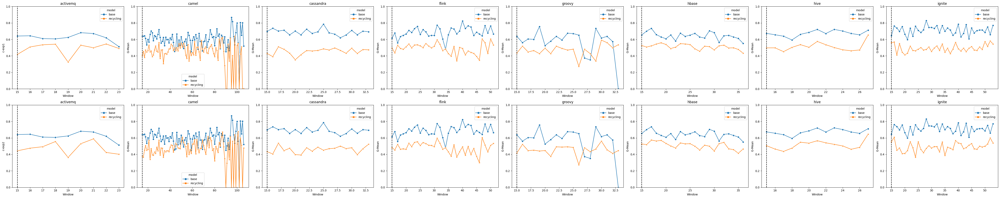

In [17]:
fig, ax = plt.subplots(figsize=(50, 5 * len(settings.CLUSTERING_EXPERIMENTS)), ncols=8, nrows=len(settings.CLUSTERING_EXPERIMENTS))
for i, exp in enumerate(settings.CLUSTERING_EXPERIMENTS):
    for j, project in enumerate(settings.PROJECTS):
        # load baseline evaluation results
        base_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_base_eval_nn.csv")
        base_eval_df["model"] = "base"
        # load ecoselekt evaluation results
        selekt_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_selekt_eval_nn.csv")
        selekt_eval_df["model"] = "recycling"
        eval_df = pd.concat([base_eval_df[base_eval_df["window"] >= settings.MODEL_HISTORY], selekt_eval_df])
        eval_df = eval_df[eval_df["window"] == eval_df["test_split"] - 2]

        sns.lineplot(x="window", y="gmean", data=eval_df, hue="model", markers=True, style="model", dashes=False, ax=ax[i][j])
        ax[i][j].set_title(f"{project}")
        ax[i][j].set_xlabel("Window")
        ax[i][j].set_ylabel("G-Mean")
        ax[i][j].set_ylim(0, 1)
        ax[i][j].axvline(x=settings.MODEL_HISTORY, color="black", linestyle="--")
    
    # add title to row
    ax[i][0].set_ylabel(f"{exp}")

plt.tight_layout()
plt.show()

## RQ3

In [18]:
BEST_EXPERIMENTS = ["mst-exp8"]

In [19]:
def get_formatting_count(count):
    formatting = ""
    if count >= 6:
        formatting = "\\cellcolor{red!50}"
    elif count >= 4:
        formatting = "\\cellcolor{orange!50}"
    elif count >= 2:
        formatting = "\\cellcolor{yellow!50}"
    return formatting

temp = all_stats[all_stats["experiment"].isin(BEST_EXPERIMENTS)]
summary_stats = temp.groupby(["experiment"]).agg(
    precision=("precision_sig", "sum"),
    recall=("recall_sig", "sum"),
    gmean=("gmean_sig", "sum"),
    auc=("auc_sig", "sum"),
    f1=("f1_sig", "sum"),
)
summary_stats = summary_stats.reset_index()

# loop through rows and find which column for each row has the highest value
for row in summary_stats.index:
    col = summary_stats.loc[row]
    for metric in ["precision", "recall", "gmean", "auc", "f1"]:
        formatting = get_formatting_count(col[metric])
        # redo formatting for a specific cell
        summary_stats.loc[row, metric] = f"{formatting}{col[metric]}/8"

print(summary_stats.to_latex(index=False))

\begin{tabular}{llllll}
\toprule
experiment & precision &                   recall &                 gmean &                   auc &                    f1 \\
\midrule
  mst-exp8 &       1/8 & \textbackslash cellcolor\{orange!50\}4/8 & \textbackslash cellcolor\{red!50\}6/8 & \textbackslash cellcolor\{red!50\}6/8 & \textbackslash cellcolor\{red!50\}6/8 \\
\bottomrule
\end{tabular}



## EXTRA EXPERIMENTS

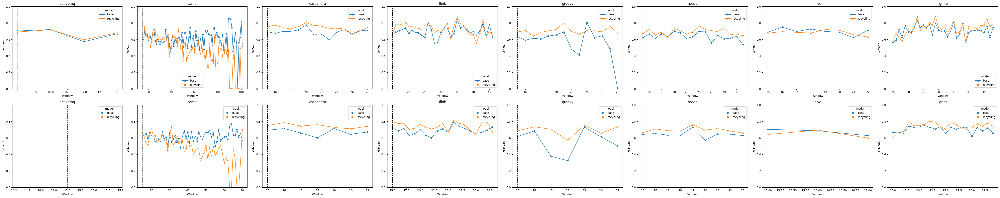

In [20]:
fig, ax = plt.subplots(figsize=(50, 5 * len(settings.NN_EXTRA_EXPERIMENTS)), ncols=8, nrows=len(settings.NN_EXTRA_EXPERIMENTS))
for i, exp in enumerate(settings.NN_EXTRA_EXPERIMENTS):
    for j, project in enumerate(settings.PROJECTS):
        # load baseline evaluation results
        base_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_base_eval_nn.csv")
        base_eval_df["model"] = "base"
        # load ecoselekt evaluation results
        selekt_eval_df = pd.read_csv(RESULTS_DIR / exp / f"{EXP_ID}_{project}_selekt_eval_nn.csv")
        selekt_eval_df["model"] = "recycling"
        eval_df = pd.concat([base_eval_df[base_eval_df["window"] >= settings.MODEL_HISTORY], selekt_eval_df])
        eval_df = eval_df[eval_df["window"] == eval_df["test_split"] - 2]

        sns.lineplot(x="window", y="gmean", data=eval_df, hue="model", markers=True, style="model", dashes=False, ax=ax[i][j])
        ax[i][j].set_title(f"{project}")
        ax[i][j].set_xlabel("Window")
        ax[i][j].set_ylabel("G-Mean")
        ax[i][j].set_ylim(0, 1)
        ax[i][j].axvline(x=settings.MODEL_HISTORY, color="black", linestyle="--")
    
    # add title to row
    ax[i][0].set_ylabel(f"{exp}")

plt.tight_layout()
plt.show()